# Imágenes satelitales NASA SpaceApps training [@AESS Unicauca](https://www.facebook.com/aess.unicauca)


<div>
<img src="https://scontent-cdt1-1.xx.fbcdn.net/v/t1.6435-9/118780304_110680027439091_6003266213247663045_n.png?_nc_cat=109&ccb=1-5&_nc_sid=e3f864&_nc_ohc=Tcve37sJDUoAX9uLEjb&_nc_ht=scontent-cdt1-1.xx&oh=57d2a68426f5bcf96f57abe55530ca6e&oe=616F5DA0" width="700" height = "400"/>
</div>


En el siguiente notebook se exploran diferentes tipos de imágenes satelitales y diferentes métodos para descargar dichos datos a través de Sentinelhub. Finalmente se hace una breve introducción a machine learning y deep learning a través de Sklearn y Tensorflow. 

Por [Sebastian Cajas Ordóñez](https://sebasmos.github.io/)  

## Outline
1. [Instalar dependencias](#0)
2. [Extracción de imágenes individuales](#1)
3. [Extracción de imágenes satelitles sin nubes](#2)
4. [Extracción de diferentes bandas espectrales](#3)
5. [Descargar imágenes](#4)
6. [Extracción de imágenes multitemporales](#5)
7. [Colecciones](#6) 
8. [Fusión de bandas espectrales](#7)
9. [Google Earth Engine](#8)
10. [Machine learning - Ejemplo práctico](#9)
11. [Deep Learning - Ejemplo práctico](#10)

<a name='0'></a>
# Instalar dependencias

In [1]:
! git clone https://github.com/sentinel-hub/sentinelhub-py.git
% cd sentinelhub-py
! python setup.py build
! python setup.py install
! pip install -r requirements.txt --force
! pip install utm --force
! pip install pyproj --force
! pip install aenum --force

fatal: destination path 'sentinelhub-py' already exists and is not an empty directory.
/content/sentinelhub-py
running build
running build_py
running egg_info
writing sentinelhub.egg-info/PKG-INFO
writing dependency_links to sentinelhub.egg-info/dependency_links.txt
writing entry points to sentinelhub.egg-info/entry_points.txt
writing requirements to sentinelhub.egg-info/requires.txt
writing top-level names to sentinelhub.egg-info/top_level.txt
reading manifest template 'MANIFEST.in'
adding license file 'LICENSE.md'
writing manifest file 'sentinelhub.egg-info/SOURCES.txt'
copying sentinelhub/config.json -> build/lib/sentinelhub
running install
running bdist_egg
running egg_info
writing sentinelhub.egg-info/PKG-INFO
writing dependency_links to sentinelhub.egg-info/dependency_links.txt
writing entry points to sentinelhub.egg-info/entry_points.txt
writing requirements to sentinelhub.egg-info/requires.txt
writing top-level names to sentinelhub.egg-info/top_level.txt
reading manifest templa

  Using cached utm-0.7.0-py3-none-any.whl
  Attempting uninstall: utm
    Found existing installation: utm 0.7.0
    Uninstalling utm-0.7.0:
      Successfully uninstalled utm-0.7.0
  Using cached pyproj-3.2.1-cp37-cp37m-manylinux2010_x86_64.whl (6.3 MB)
  Using cached certifi-2021.5.30-py2.py3-none-any.whl (145 kB)
  Attempting uninstall: certifi
    Found existing installation: certifi 2021.5.30
    Uninstalling certifi-2021.5.30:
      Successfully uninstalled certifi-2021.5.30
  Attempting uninstall: pyproj
    Found existing installation: pyproj 3.2.1
    Uninstalling pyproj-3.2.1:
      Successfully uninstalled pyproj-3.2.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.26.0 which is incompatible.
google-colab 1.0.0 requires six~=1.15.0, but you have six 1.16.0 which is incompatible.
d

In [2]:
from sentinelhub import SHConfig

# Reemplazar por sus credenciales en Sentinel-hub
CLIENT_ID = "****"
CLIENT_SECRET = "****"

config = SHConfig()

if CLIENT_ID and CLIENT_SECRET:
    config.sh_client_id = CLIENT_ID
    config.sh_client_secret=CLIENT_SECRET

if not config.sh_client_id or not config.sh_client_secret:
    print("Warning! To use Process API, please provide the credentials (OAuth client ID and client secret).")

In [5]:
import os
import datetime
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sentinelhub import MimeType, CRS, BBox, SentinelHubRequest, SentinelHubDownloadClient, DataCollection, bbox_to_dimensions, DownloadRequest
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [4]:
def plot_image(image, factor=1.0, clip_range=None, **kwargs):
    """
    Utility function for plotting RGB images.
    """
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 15))
    if clip_range is not None:
        ax.imshow(np.clip(image * factor, *clip_range), **kwargs)
    else:
        ax.imshow(image * factor, **kwargs)
    ax.set_xticks([])
    ax.set_yticks([])

Selección de coordenadas usando [Request builder](https://apps.sentinel-hub.com/requests-builder/)

In [5]:
popayan_coordinates =  [
  -76.658611,
  2.426429,
  -76.576244,
  2.491943
]

In [6]:
resolution = 10
popayan_bbox = BBox(bbox=popayan_coordinates, crs=CRS.WGS84)
popayan_size = bbox_to_dimensions(popayan_bbox, resolution=resolution)

print(f'Image shape at {resolution} m resolution: {popayan_size} pixels')

Image shape at 10 m resolution: (917, 723) pixels


<a name='1'></a>
# Extracción de imagen individual

Usando [Sentinel 2L1C](https://docs.sentinel-hub.com/api/latest/data/sentinel-2-l1c/)

In [7]:
evalscript_true_color = """
    //VERSION=3

    function setup() {
        return {
            input: [{
                bands: ["B02", "B03", "B04"]
            }],
            output: {
                bands: 3
            }
        };
    }

    function evaluatePixel(sample) {
        return [sample.B04, sample.B03, sample.B02];
    }
"""

request_true_color = SentinelHubRequest(
    evalscript=evalscript_true_color,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L1C,
            time_interval=('2020-01-01', '2020-12-31'),
        )
    ],
    responses=[
        SentinelHubRequest.output_response('default', MimeType.PNG)
    ],
    bbox=popayan_bbox,
    size=popayan_size,
    config=config
)

In [8]:
true_color_imgs = request_true_color.get_data()

In [9]:
print(f'Returned data is of type = {type(true_color_imgs)} and length {len(true_color_imgs)}.')
print(f'Single element in the list is of type {type(true_color_imgs[-1])} and has shape {true_color_imgs[-1].shape}')

Returned data is of type = <class 'list'> and length 1.
Single element in the list is of type <class 'numpy.ndarray'> and has shape (723, 917, 3)


Image type: uint8


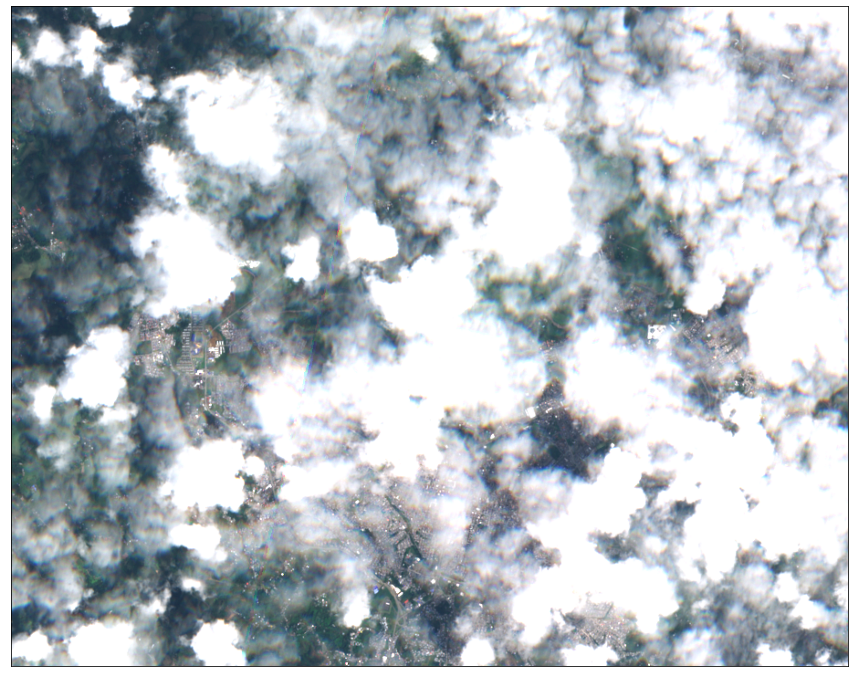

In [10]:
image = true_color_imgs[0]
print(f'Image type: {image.dtype}')

# plot function
# factor 1/255 to scale between 0-1
# factor 3.5 to increase brightness
plot_image(image, factor=3.5/255, clip_range=(0,1))

<a name='2'></a>
# Imagen satelital de Popayán sin nubes 

In [ ]:
request_leastClouds = SentinelHubRequest(
    evalscript=evalscript_true_color,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L1C,
            time_interval=('2020-01-01', '2020-12-31'),
            mosaicking_order='leastCC'
        )
    ],
    responses=[
        SentinelHubRequest.output_response('default', MimeType.PNG)
    ],
    bbox=popayan_bbox,
    size=popayan_size,
    config=config
)

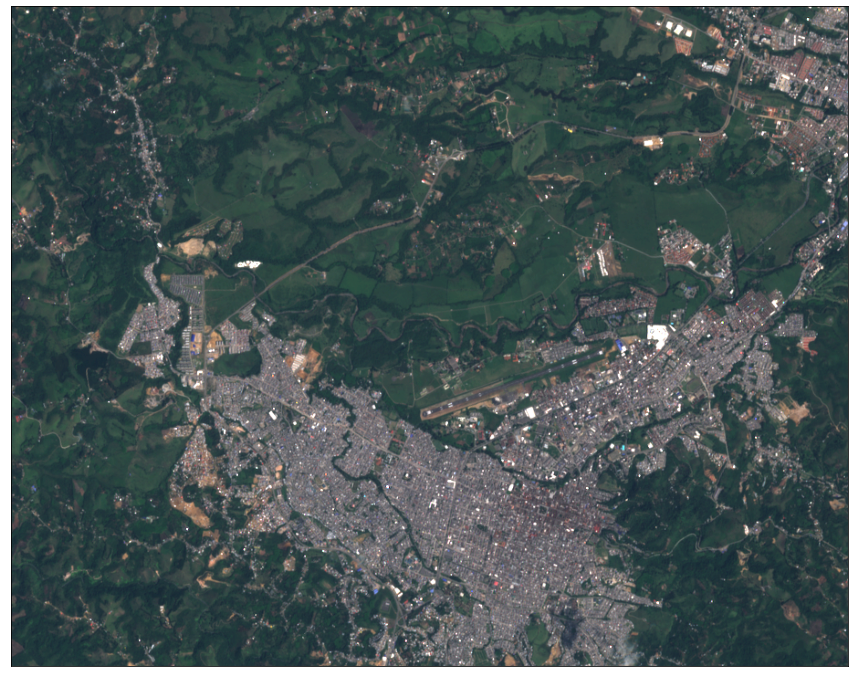

In [ ]:
plot_image(request_leastClouds.get_data()[0], factor=3.5/255, clip_range=(0,1))

<a name='3'></a>
# Imagen satelital usando todas las bandas de Sentinel 2 L1C

In [ ]:
evalscript_all_bands = """
    //VERSION=3
    function setup() {
        return {
            input: [{
                bands: ["B01","B02","B03","B04","B05","B06","B07","B08"],
                units: "DN"
            }],
            output: {
                bands: 13,
                sampleType: "INT16"
            }
        };
    }

    function evaluatePixel(sample) {
        return [sample.B01, 
                sample.B02, 
                sample.B03, 
                sample.B04, 
                sample.B05, 
                sample.B06, 
                sample.B07, 
                sample.B08, 
                sample.B8A, 
                sample.B09, 
                sample.B10, 
                sample.B11, 
                sample.B12];
    }
"""

request_all_bands = SentinelHubRequest(
    evalscript=evalscript_all_bands,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L1C,
            time_interval=('2020-01-01', '2020-06-30'),
            mosaicking_order='leastCC'
    )],
    responses=[
        SentinelHubRequest.output_response('default', MimeType.TIFF)
    ],
    bbox=popayan_bbox,
    size=popayan_size,
    config=config
)

all_bands_response = request_all_bands.get_data()

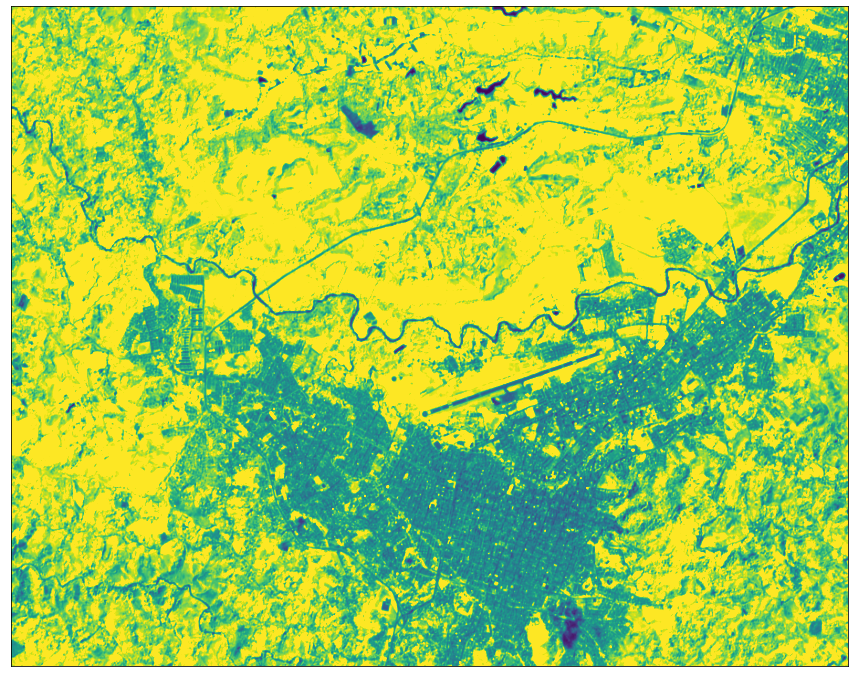

In [ ]:
plot_image(all_bands_response[0][:, :, 7], factor=3.5/1e4, vmax=1)

<a name='4'></a>
# Descargar imagenes

In [ ]:
request_leastClouds = SentinelHubRequest(
    data_folder='popayan',
    evalscript=evalscript_true_color,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L1C,
            time_interval=('2020-01-01', '2020-12-31'),
            mosaicking_order='leastCC'
        )
    ],
    responses=[
        SentinelHubRequest.output_response('default', MimeType.PNG)
    ],
    bbox=popayan_bbox,
    size=popayan_size,
    config=config
)

In [ ]:
import os
directory = "/content/popayan"

if not os.path.exists(directory):
  os.mkdir(directory)

In [ ]:
request_leastClouds.save_data()

for folder, _, filenames in os.walk(request_leastClouds.data_folder):
    for filename in filenames:
        print(os.path.join(folder, filename))

popayan/5777f431266c9e63f5765320e87e377f/request.json
popayan/5777f431266c9e63f5765320e87e377f/response.png


<a name='5'></a>
# Multiples imagenes a lo largo del tiempo

In [ ]:
start = datetime.datetime(2019,1,1)
end = datetime.datetime(2019,12,31)
n_chunks = 13
tdelta = (end - start) / n_chunks
edges = [(start + i*tdelta).date().isoformat() for i in range(n_chunks)]
slots = [(edges[i], edges[i+1]) for i in range(len(edges)-1)]

print('Monthly time windows:\n')
for slot in slots:
    print(slot)

Monthly time windows:

('2019-01-01', '2019-01-29')
('2019-01-29', '2019-02-26')
('2019-02-26', '2019-03-26')
('2019-03-26', '2019-04-23')
('2019-04-23', '2019-05-21')
('2019-05-21', '2019-06-18')
('2019-06-18', '2019-07-16')
('2019-07-16', '2019-08-13')
('2019-08-13', '2019-09-10')
('2019-09-10', '2019-10-08')
('2019-10-08', '2019-11-05')
('2019-11-05', '2019-12-03')


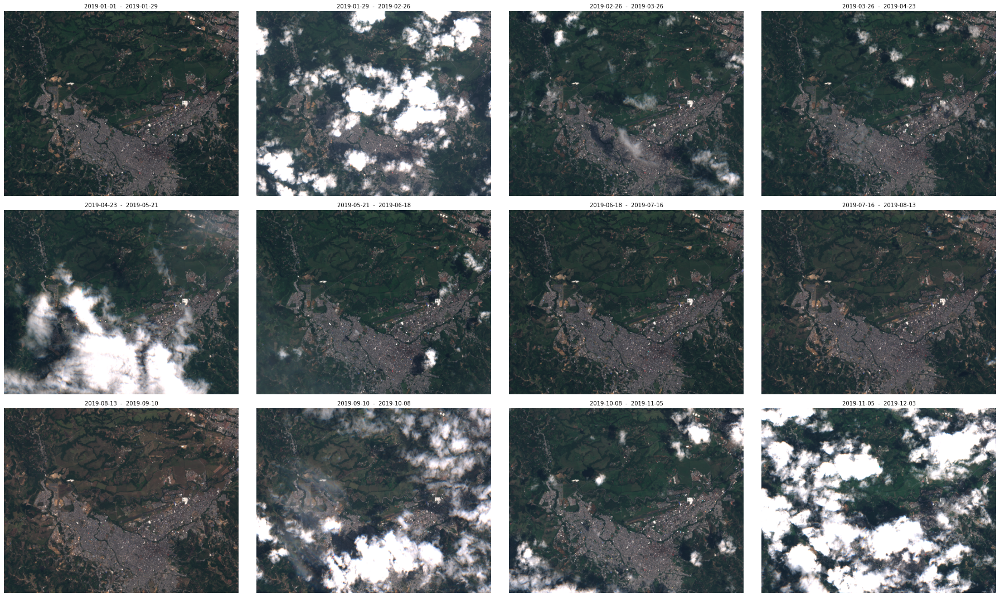

In [ ]:
def get_true_color_request(time_interval):
    return SentinelHubRequest(
        evalscript=evalscript_true_color,
        input_data=[
            SentinelHubRequest.input_data(
                data_collection=DataCollection.SENTINEL2_L1C,
                time_interval=time_interval,
                mosaicking_order='leastCC'
            )
        ],
        responses=[
            SentinelHubRequest.output_response('default', MimeType.PNG)
        ],
        bbox=popayan_bbox,
        size=popayan_size,
        config=config
    )

# create a list of requests
list_of_requests = [get_true_color_request(slot) for slot in slots]
list_of_requests = [request.download_list[0] for request in list_of_requests]

# download data with multiple threads
data = SentinelHubDownloadClient(config=config).download(list_of_requests, max_threads=5)


# some stuff for pretty plots
ncols = 4
nrows = 3
aspect_ratio = popayan_size[0] / popayan_size[1]
subplot_kw = {'xticks': [], 'yticks': [], 'frame_on': False}

fig, axs = plt.subplots(ncols=ncols, nrows=nrows, figsize=(5 * ncols * aspect_ratio, 5 * nrows),
                        subplot_kw=subplot_kw)

for idx, image in enumerate(data):
    ax = axs[idx // ncols][idx % ncols]
    ax.imshow(np.clip(image * 2.5/255, 0, 1))
    ax.set_title(f'{slots[idx][0]}  -  {slots[idx][1]}', fontsize=10)

plt.tight_layout()

<a name='6'></a>
# Explorando collecciones disponibles
 

In [ ]:
from sentinelhub import DataCollection

for collection in DataCollection.get_available_collections():
    print(collection)

DataCollection.SENTINEL2_L1C
DataCollection.SENTINEL2_L2A
DataCollection.SENTINEL1
DataCollection.SENTINEL1_IW
DataCollection.SENTINEL1_IW_ASC
DataCollection.SENTINEL1_IW_DES
DataCollection.SENTINEL1_EW
DataCollection.SENTINEL1_EW_ASC
DataCollection.SENTINEL1_EW_DES
DataCollection.SENTINEL1_EW_SH
DataCollection.SENTINEL1_EW_SH_ASC
DataCollection.SENTINEL1_EW_SH_DES
DataCollection.DEM
DataCollection.DEM_MAPZEN
DataCollection.DEM_COPERNICUS_30
DataCollection.DEM_COPERNICUS_90
DataCollection.MODIS
DataCollection.LANDSAT_MSS_L1
DataCollection.LANDSAT_TM_L1
DataCollection.LANDSAT_TM_L2
DataCollection.LANDSAT_ETM_L1
DataCollection.LANDSAT_ETM_L2
DataCollection.LANDSAT_OT_L1
DataCollection.LANDSAT_OT_L2
DataCollection.SENTINEL5P
DataCollection.SENTINEL3_OLCI
DataCollection.SENTINEL3_SLSTR


In [ ]:
DataCollection.SENTINEL2_L2A

<DataCollection.SENTINEL2_L2A: DataCollectionDefinition(
  api_id: sentinel-2-l2a
  catalog_id: sentinel-2-l2a
  wfs_id: DSS2
  service_url: https://services.sentinel-hub.com
  collection_type: Sentinel-2
  sensor_type: MSI
  processing_level: L2A
  bands: ('B01', 'B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B8A', 'B09', 'B11', 'B12')
  is_timeless: False
  has_cloud_coverage: True
)>

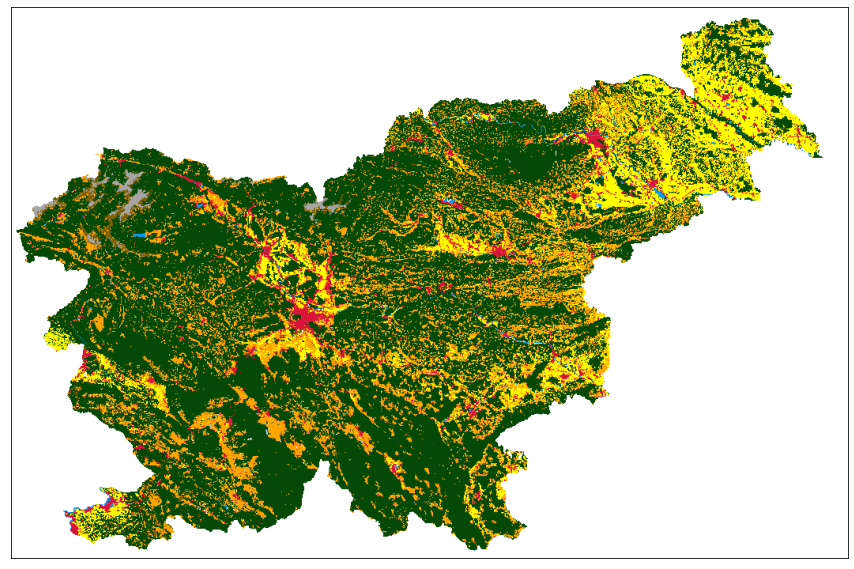

In [ ]:
collection_id = '7453e962-0ee5-4f74-8227-89759fbe9ba9'

byoc = DataCollection.define_byoc(
    collection_id,
    name='SLOVENIA_LAND_COVER',
    is_timeless=True
)

from sentinelhub import bbox_to_dimensions

slovenia_bbox = BBox([13.353882, 45.402307, 16.644287, 46.908998], crs=CRS.WGS84)
slovenia_size = bbox_to_dimensions(slovenia_bbox, resolution=240)

evalscript_byoc = """
//VERSION=3
function setup() {
  return {
    input: ["lulc_reference"],
    output: { bands: 3 }
  };
}

var colorDict = {
  0: [255/255, 255/255, 255/255],
  1: [255/255, 255/255, 0/255],
  2: [5/255, 73/255, 7/255],
  3: [255/255, 165/255, 0/255],
  4: [128/255, 96/255, 0/255],
  5: [6/255, 154/255, 243/255],
  6: [149/255, 208/255, 252/255],
  7: [150/255, 123/255, 182/255],
  8: [220/255, 20/255, 60/255],
  9: [166/255, 166/255, 166/255],
  10: [0/255, 0/255, 0/255]
}

function evaluatePixel(sample) {
  return colorDict[sample.lulc_reference];
}
"""

byoc_request = SentinelHubRequest(
    evalscript=evalscript_byoc,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=byoc
        )],
    responses=[
        SentinelHubRequest.output_response('default', MimeType.TIFF)
    ],
    bbox=slovenia_bbox,
    size=slovenia_size,
    config=config
)

byoc_data = byoc_request.get_data()
plot_image(byoc_data[0], factor=1/255)

<a name='7'></a>
# Fusión de bandas espectrales

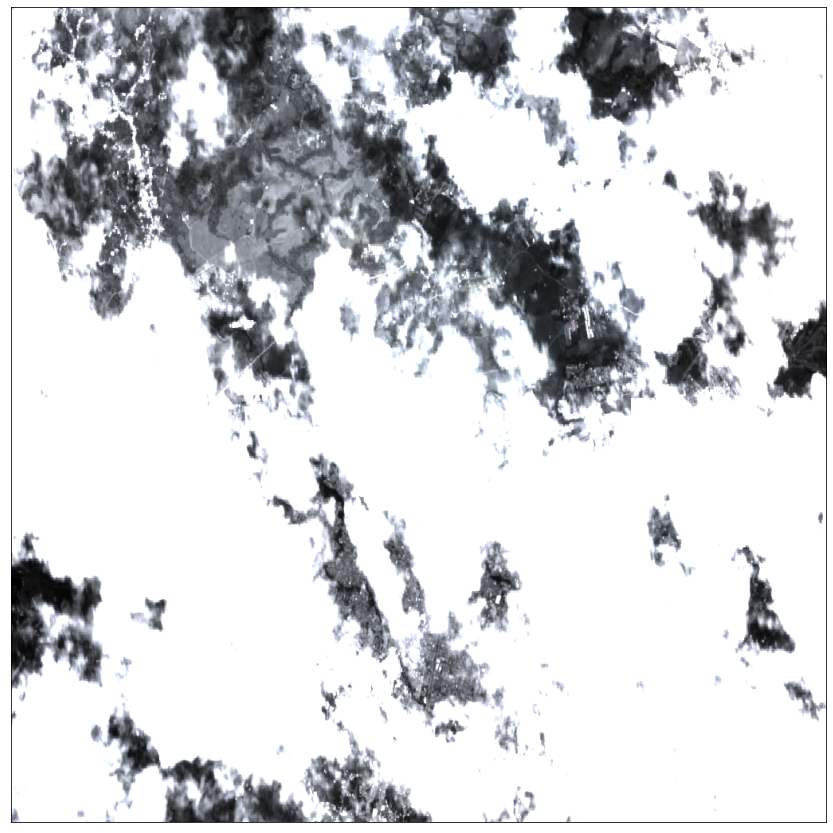

In [ ]:
evalscript = """
//VERSION=3
function setup() {
  return {
    input: [{
        datasource: "ls8",
        bands: ["B02", "B03", "B04", "B05", "B08"]
      },
      {
        datasource: "l2a",
        bands: ["B02", "B03", "B04", "B08", "B11"]
      }
    ],
    output: [{
      bands: 3
    }]
  }
}
let minVal = 0.0
let maxVal = 0.4
let viz = new DefaultVisualizer(minVal, maxVal)

function evaluatePixel(samples, inputData, inputMetadata, customData, outputMetadata) {
  var sample = samples.ls8[0]
  var sample2 = samples.l2a[0]
  // Use weighted arithmetic average of S2.B02 - S2.B04 for pan-sharpening
  let sudoPanW3 = (sample.B04 + sample.B03 + sample.B02) / 3
  let s2PanR3 = (sample2.B04 + sample2.B03 + sample2.B02) / 3
  let s2ratioWR3 = s2PanR3 / sudoPanW3
  let val = [sample.B04 * s2ratioWR3, sample.B03 * s2ratioWR3, sample.B02 * s2ratioWR3]
  return viz.processList(val)
}
"""

request = SentinelHubRequest(
    evalscript=evalscript,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.LANDSAT_OT_L1,
            identifier='ls8',  # has to match Landsat input datasource id in evalscript
            time_interval=('2020-01-21', '2020-05-23')
        ),
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A,
            identifier='l2a',  # has to match Sentinel input datasource id in evalscript
            time_interval=('2020-01-21', '2020-05-23'),
        )
    ],
    responses=[
        SentinelHubRequest.output_response('default', MimeType.PNG)
    ],
    bbox=BBox((  -76.658611,
                  2.426429,
                  -76.576244,
                  2.491943), CRS.WGS84),
    size=(1024, 1024),
    config=config
)

image = request.get_data()[0]

plot_image(image, factor=3.5/255, clip_range=(0, 1))


<a name='8'></a>
# Google Earth Engine

In [2]:
!pip install earthengine-api #earth-engine Python API

In [3]:
!earthengine authenticate 

Instructions for updating:
non-resource variables are not supported in the long term
To authorize access needed by Earth Engine, open the following URL in a web browser and follow the instructions. If the web browser does not start automatically, please manually browse the URL below.

    https://accounts.google.com/o/oauth2/auth?client_id=517222506229-vsmmajv00ul0bs7p89v5m89qs8eb9359.apps.googleusercontent.com&scope=https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fearthengine+https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdevstorage.full_control&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&response_type=code&code_challenge=NRoi6SmPOIGzLx0aV7Xly89r0TsayODuCjJCC-a1bx0&code_challenge_method=S256

The authorization workflow will generate a code, which you should paste in the box below. 
Enter verification code: 4/1AX4XfWi8x55_XkJL8R-0t6v0TGyUZpT9WdImGkMPLyMoQf7SaTdr9glGJl0

Successfully saved authorization token.


In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
from google.colab import auth
auth.authenticate_user()

In [9]:
# Earth Engine Python API
import ee
ee.Initialize()

In [11]:
import folium

# Define the URL format used for Earth Engine generated map tiles.
EE_TILES = 'https://earthengine.googleapis.com/map/{mapid}/{{z}}/{{x}}/{{y}}?token={token}'

print('Folium version: ' + folium.__version__)

Folium version: 0.8.3


In [6]:
#@title Mapdisplay: Display GEE objects using folium.
def Mapdisplay(center, dicc, Tiles="OpensTreetMap",zoom_start=10):
    '''
    :param center: Center of the map (Latitude and Longitude).
    :param dicc: Earth Engine Geometries or Tiles dictionary
    :param Tiles: Mapbox Bright,Mapbox Control Room,Stamen Terrain,Stamen Toner,stamenwatercolor,cartodbpositron.
    :zoom_start: Initial zoom level for the map.
    :return: A folium.Map object.
    '''
    mapViz = folium.Map(location=center,tiles=Tiles, zoom_start=zoom_start)
    for k,v in dicc.items():
      if ee.image.Image in [type(x) for x in v.values()]:
        folium.TileLayer(
            tiles = EE_TILES.format(**v),
            attr  = 'Google Earth Engine',
            overlay =True,
            name  = k
          ).add_to(mapViz)
      else:
        folium.GeoJson(
        data = v,
        name = k
          ).add_to(mapViz)
    mapViz.add_child(folium.LayerControl())
    return mapViz

In [18]:
# Load a landsat image and select three bands.
landsat = ee.Image('LANDSAT/LC08/C01/T1_TOA/LC08_123032_20140515')\
            .select(['B4', 'B3', 'B2'])

# Create a geometry representing an export region.
geometry = ee.Geometry.Rectangle([  -76.658611,
                                    2.426429,
                                    -76.576244,
                                    2.491943])
center = geometry.centroid().getInfo()['coordinates']
center.reverse()

Mapdisplay(center,{'landsat':landsat.getMapId()},zoom_start=13)

In [13]:
# Export the image, specifying scale and region.
task = ee.batch.Export.image.toDrive(**{
    'image': landsat,
    'description': 'imageToDriveExample',
    'folder':'Example_folder',
    'scale': 100,
    'region': geometry.getInfo()['coordinates']
})
task.start()

In [14]:
import time 
while task.active():
  print('Polling for task (id: {}).'.format(task.id))
  time.sleep(5)

Polling for task (id: SXQHMA4WDT3DOETEARRKO5XH).
Polling for task (id: SXQHMA4WDT3DOETEARRKO5XH).
Polling for task (id: SXQHMA4WDT3DOETEARRKO5XH).
Polling for task (id: SXQHMA4WDT3DOETEARRKO5XH).
Polling for task (id: SXQHMA4WDT3DOETEARRKO5XH).


Adapted from [this tutorial](https://colab.research.google.com/github/csaybar/EEwPython/blob/dev/10_Export.ipynb#scrollTo=5VhMvaETVkXX).

<a name='8'></a>
# Wheather monitoring 
Download dataset [here](https://www.kaggle.com/muthuj7/weather-dataset)


In [6]:
!gdown --id 10Fxd8W6IlCVBCC6ZyeOO3gKk15zDfn8h
!unzip archive.zip
!echo "Ready"

Downloading...
From: https://drive.google.com/uc?id=10Fxd8W6IlCVBCC6ZyeOO3gKk15zDfn8h
To: /content/archive.zip
2.34MB [00:00, 71.9MB/s]
Archive:  archive.zip
replace weatherHistory.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: weatherHistory.csv      


In [8]:
df = pd.read_csv("weatherHistory.csv")
df.info

<bound method DataFrame.info of                       Formatted Date  ...                           Daily Summary
0      2006-04-01 00:00:00.000 +0200  ...       Partly cloudy throughout the day.
1      2006-04-01 01:00:00.000 +0200  ...       Partly cloudy throughout the day.
2      2006-04-01 02:00:00.000 +0200  ...       Partly cloudy throughout the day.
3      2006-04-01 03:00:00.000 +0200  ...       Partly cloudy throughout the day.
4      2006-04-01 04:00:00.000 +0200  ...       Partly cloudy throughout the day.
...                              ...  ...                                     ...
96448  2016-09-09 19:00:00.000 +0200  ...  Partly cloudy starting in the morning.
96449  2016-09-09 20:00:00.000 +0200  ...  Partly cloudy starting in the morning.
96450  2016-09-09 21:00:00.000 +0200  ...  Partly cloudy starting in the morning.
96451  2016-09-09 22:00:00.000 +0200  ...  Partly cloudy starting in the morning.
96452  2016-09-09 23:00:00.000 +0200  ...  Partly cloudy starting 

In [9]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Temperature (C),96453.0,11.932678,9.551546,-21.822222,4.688889,12.0000,18.838889,39.905556
Apparent Temperature (C),96453.0,10.855029,10.696847,-27.716667,2.311111,12.0000,18.838889,39.344444
Humidity,96453.0,0.734899,0.195473,0.000000,0.600000,0.7800,0.890000,1.000000
Wind Speed (km/h),96453.0,10.810640,6.913571,0.000000,5.828200,9.9659,14.135800,63.852600
Wind Bearing (degrees),96453.0,187.509232,107.383428,0.000000,116.000000,180.0000,290.000000,359.000000
Visibility (km),96453.0,10.347325,4.192123,0.000000,8.339800,10.0464,14.812000,16.100000
Loud Cover,96453.0,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000
Pressure (millibars),96453.0,1003.235956,116.969906,0.000000,1011.900000,1016.4500,1021.090000,1046.380000


In [10]:
df.isnull().sum()

Formatted Date                0
Summary                       0
Precip Type                 517
Temperature (C)               0
Apparent Temperature (C)      0
Humidity                      0
Wind Speed (km/h)             0
Wind Bearing (degrees)        0
Visibility (km)               0
Loud Cover                    0
Pressure (millibars)          0
Daily Summary                 0
dtype: int64

In [11]:
df['Precip Type'].value_counts()

rain    85224
snow    10712
Name: Precip Type, dtype: int64

In [12]:
df['Precip Type'].fillna(method='ffill',inplace=True,axis=0)
df['Precip Type'].value_counts()

#with droping
df.drop('Precip Type',axis=1,inplace=True)

In [13]:
target_values=df['Summary'].value_counts().index
target_values

Index(['Partly Cloudy', 'Mostly Cloudy', 'Overcast', 'Clear', 'Foggy',
       'Breezy and Overcast', 'Breezy and Mostly Cloudy',
       'Breezy and Partly Cloudy', 'Dry and Partly Cloudy',
       'Windy and Partly Cloudy', 'Light Rain', 'Breezy', 'Windy and Overcast',
       'Humid and Mostly Cloudy', 'Drizzle', 'Breezy and Foggy',
       'Windy and Mostly Cloudy', 'Dry', 'Humid and Partly Cloudy',
       'Dry and Mostly Cloudy', 'Rain', 'Windy', 'Humid and Overcast',
       'Windy and Foggy', 'Dangerously Windy and Partly Cloudy',
       'Windy and Dry', 'Breezy and Dry'],
      dtype='object')

In [14]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df['Summary']=le.fit_transform(df['Summary'])

print("There are {} classes.".format(len(np.unique(df["Summary"]))))

There are 27 classes.


In [89]:
df.head(5)

,Formatted Date,Summary,Temperature (C),Apparent Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Loud Cover,Pressure (millibars),Daily Summary
0,2006-04-01 00:00:00.000 +0200,19,9.472222,7.388889,0.89,14.1197,251.0,15.8263,0.0,1015.13,Partly cloudy throughout the day.
1,2006-04-01 01:00:00.000 +0200,19,9.355556,7.227778,0.86,14.2646,259.0,15.8263,0.0,1015.63,Partly cloudy throughout the day.
2,2006-04-01 02:00:00.000 +0200,17,9.377778,9.377778,0.89,3.9284,204.0,14.9569,0.0,1015.94,Partly cloudy throughout the day.
3,2006-04-01 03:00:00.000 +0200,19,8.288889,5.944444,0.83,14.1036,269.0,15.8263,0.0,1016.41,Partly cloudy throughout the day.
4,2006-04-01 04:00:00.000 +0200,17,8.755556,6.977778,0.83,11.0446,259.0,15.8263,0.0,1016.51,Partly cloudy throughout the day.


In [90]:
df.columns

Index(['Formatted Date', 'Summary', 'Temperature (C)',
       'Apparent Temperature (C)', 'Humidity', 'Wind Speed (km/h)',
       'Wind Bearing (degrees)', 'Visibility (km)', 'Loud Cover',
       'Pressure (millibars)', 'Daily Summary'],
      dtype='object')

In [15]:
y=df['Summary']
x=df[['Temperature (C)',
       'Apparent Temperature (C)', 'Humidity', 'Wind Speed (km/h)',
       'Wind Bearing (degrees)', 'Visibility (km)',
       'Pressure (millibars)']]

In [36]:
x.corr()

,Temperature (C),Apparent Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Pressure (millibars)
Temperature (C),1.000000,0.992629,-0.632255,0.008957,0.029988,0.392847,-0.005447
Apparent Temperature (C),0.992629,1.000000,-0.602571,-0.056650,0.029031,0.381718,-0.000219
Humidity,-0.632255,-0.602571,1.000000,-0.224951,0.000735,-0.369173,0.005454
Wind Speed (km/h),0.008957,-0.056650,-0.224951,1.000000,0.103822,0.100749,-0.049263
Wind Bearing (degrees),0.029988,0.029031,0.000735,0.103822,1.000000,0.047594,-0.011651
Visibility (km),0.392847,0.381718,-0.369173,0.100749,0.047594,1.000000,0.059818
Pressure (millibars),-0.005447,-0.000219,0.005454,-0.049263,-0.011651,0.059818,1.000000


In [92]:
x.drop('Apparent Temperature (C)',axis=1,inplace=True)
x.shape

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


(96453, 6)

In [93]:
x.head(10)

,Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Pressure (millibars)
0,9.472222,0.89,14.1197,251.0,15.8263,1015.13
1,9.355556,0.86,14.2646,259.0,15.8263,1015.63
2,9.377778,0.89,3.9284,204.0,14.9569,1015.94
3,8.288889,0.83,14.1036,269.0,15.8263,1016.41
4,8.755556,0.83,11.0446,259.0,15.8263,1016.51
5,9.222222,0.85,13.9587,258.0,14.9569,1016.66
6,7.733333,0.95,12.3648,259.0,9.9820,1016.72
7,8.772222,0.89,14.1519,260.0,9.9820,1016.84
8,10.822222,0.82,11.3183,259.0,9.9820,1017.37
9,13.772222,0.72,12.5258,279.0,9.9820,1017.22


In [71]:
y.unique()

array([19, 17, 18, 12,  3,  6,  5,  4, 13, 15, 23, 25,  2, 26,  0, 11, 24,
        7,  9, 21, 14, 16,  8, 22, 10,  1, 20])

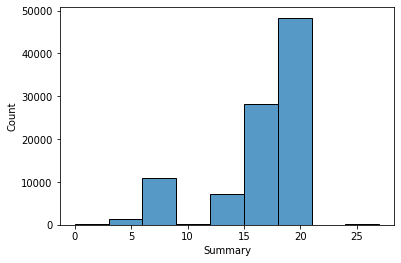

In [94]:
import seaborn as sns
sns.histplot(y, binwidth=3, bins=len(y.unique()))

In [95]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=1)

print("Training instances   {}, Training features   {}".format(x_train.shape[0], x_train.shape[1]))
print("Testing instances    {}, Testing features    {}".format(x_test.shape[0], x_test.shape[1]))

Training instances   77162, Training features   6
Testing instances    19291, Testing features    6


In [40]:
from sklearn.preprocessing import StandardScaler

sc=StandardScaler()
x_train=sc.fit_transform(x_train)
x_test=sc.transform(x_test)

In [41]:
from sklearn.ensemble import RandomForestClassifier

rf=RandomForestClassifier(max_depth=32,n_estimators=120,random_state=1)
rf.fit(x_train,y_train)
y_pred=rf.predict(x_test)

In [42]:
from sklearn import metrics

metrics.accuracy_score(y_test,y_pred)

0.5874241874449225

<a name='9'></a>
# Practical example - Deep learning

In [17]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

In [18]:
n_classes = len(np.unique(y))

labels_cat = to_categorical(y, num_classes=n_classes)

In [19]:
x_train,x_test,y_train,y_test=train_test_split(x,labels_cat,test_size=0.2,random_state=1)

print("Training instances   {}, Training features   {}".format(x_train.shape[0], x_train.shape[1]))
print("Testing instances    {}, Testing features    {}".format(x_test.shape[0], x_test.shape[1]))
print("Hot-encoded label: ", y_train.shape)

Training instances   77162, Training features   7
Testing instances    19291, Testing features    7
Hot-encoded label:  (77162, 27)


In [20]:
labels_cat.shape

(96453, 27)

In [21]:
from sklearn.utils.class_weight import compute_class_weight
weights = compute_class_weight('balanced', np.unique(np.ravel(y,order='C')),np.ravel(y,order='C')) 
weights

array([6.61543210e+01, 3.57233333e+03, 1.02066667e+02, 6.92312661e+00,
       6.76578283e+00, 9.25474957e+00, 3.28037955e-01, 3.57233333e+03,
       9.15982906e+01, 1.05068627e+02, 2.55166667e+02, 4.15387597e+01,
       4.99766835e-01, 8.93083333e+01, 5.10333333e+02, 2.10137255e+02,
       5.67037037e+01, 1.27156451e-01, 2.15239702e-01, 1.12574712e-01,
       3.57233333e+02, 4.46541667e+02, 3.57233333e+03, 8.93083333e+02,
       1.02066667e+02, 7.93851852e+01, 5.33184080e+01])

In [22]:
def get_model_baseline(x,n_classes):
  model_keras_seq = Sequential()
  model_keras_seq.add(Dense(128, input_shape=(x.shape[0], x.shape[1]), activation='relu'))
  model_keras_seq.add(Dense(64, activation='relu'))
  model_keras_seq.add(Dense(n_classes, activation='sigmoid'))
  return model_keras_seq

In [23]:
model = get_model_baseline(x_train, n_classes)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['acc'])
model.summary()


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 77162, 128)        1024      
_________________________________________________________________
dense_1 (Dense)              (None, 77162, 64)         8256      
_________________________________________________________________
dense_2 (Dense)              (None, 77162, 27)         1755      
Total params: 11,035
Trainable params: 11,035
Non-trainable params: 0
_________________________________________________________________


In [24]:
from keras.callbacks import ModelCheckpoint, EarlyStopping,TensorBoard

earlystopper = EarlyStopping(monitor='val_acc',
                             patience=50,
                             mode='max',
                             restore_best_weights=True)

tensorboard = TensorBoard(log_dir='./logs', write_graph=True,
                          write_images=True, update_freq='epoch')

In [26]:
example = model.fit(x_train, y_train, 
                    batch_size = 64, 
                    verbose=1, 
                    epochs=25, 
                    validation_split = 0.2,
                    shuffle=False,
                    #class_weight=weights,
                    callbacks=[earlystopper, tensorboard])

Epoch 1/25
965/965 [==============================] - 4s 4ms/step - loss: 1.1251 - acc: 0.4889 - val_loss: 1.1423 - val_acc: 0.4847
Epoch 2/25
965/965 [==============================] - 4s 4ms/step - loss: 1.1237 - acc: 0.4886 - val_loss: 1.1385 - val_acc: 0.4874
Epoch 3/25
965/965 [==============================] - 3s 4ms/step - loss: 1.1209 - acc: 0.4892 - val_loss: 1.1328 - val_acc: 0.4884
Epoch 4/25
965/965 [==============================] - 4s 4ms/step - loss: 1.1187 - acc: 0.4903 - val_loss: 1.1322 - val_acc: 0.4901
Epoch 5/25
965/965 [==============================] - 4s 4ms/step - loss: 1.1167 - acc: 0.4918 - val_loss: 1.1366 - val_acc: 0.4879
Epoch 6/25
965/965 [==============================] - 3s 4ms/step - loss: 1.1157 - acc: 0.4921 - val_loss: 1.1331 - val_acc: 0.4893
Epoch 7/25
965/965 [==============================] - 4s 4ms/step - loss: 1.1143 - acc: 0.4916 - val_loss: 1.1317 - val_acc: 0.4922
Epoch 8/25
965/965 [==============================] - 3s 4ms/step - loss: 1.

In [27]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [28]:
_, acc = model.evaluate(x_test, y_test)
print("Accuracy is = ", (acc * 100.0), "%")

603/603 [==============================] - 2s 3ms/step - loss: 1.1191 - acc: 0.5026
Accuracy is =  50.25659799575806 %


# References

[1]. [Sentinel-hub](sentinel-hub.com/) 

[2]. [Copernicus](https://github.com/sentinel-hub/sentinelhub-py/tree/master/examples)

[3]. [Sentinel-sat](https://sentinelsat.readthedocs.io/en/stable/api_overview.html#quickstart)

[4] [Google Earth Engine](https://earthengine.google.com/)